# VAD visualisation

This notebook gives examples of the procedure used to generate VAD data in the GiN database. The core method relies on [Silero](https://github.com/snakers4/silero-vad) - a pre-trained DNN model for Voice Activity Detection. To limit the impact of cross-talk between channels, an energy thresholding method is applied and its effect can be investigated here. Finally, since the `generate_vad.py` script provides the option to create an automatic transcription using Open AI's [Whisper](https://github.com/openai/whisper), an example is also provided here.

### Import libraries and model

In [27]:
import torch
torch.set_num_threads(1)
import os
from IPython.display import Audio
from pprint import pprint

import torchaudio
from typing import Callable, List
import torch.nn.functional as F
import warnings
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as mcolors
import numpy as np
import math
%matplotlib inline
import copy
import json

In [28]:
# this assumes that you have a relevant version of PyTorch installed
!pip install -q torchaudio

SAMPLING_RATE = 48000


USE_ONNX = False # change this to True if you want to test onnx model
if USE_ONNX:
    !pip install -q onnxruntime
  
model, utils = torch.hub.load(repo_or_dir='snakers4/silero-vad',
                              model='silero_vad',
                              force_reload=True,
                              onnx=USE_ONNX)

(get_speech_timestamps,
 save_audio,
 read_audio,
 VADIterator,
 collect_chunks) = utils


[notice] A new release of pip is available: 23.2.1 -> 23.3.1
[notice] To update, run: pip install --upgrade pip


Downloading: "https://github.com/snakers4/silero-vad/zipball/master" to /Users/emiliedolne/.cache/torch/hub/master.zip


## Select audio file to inspect
This includes close-talking audio as well as waiter.

In [43]:
room='room_807'
session='session_2'
timing='05_00_000'

alpha=1/5 # cross-channel energy threshold

wavclose,__ = torchaudio.load(f'/Users/emiliedolne/Library/CloudStorage/OneDrive-SharedLibraries-ImperialCollegeLondon/FRL - EE - Array Recordings - Array Recordings/processed_data/{room}/close_talking_audio/{session}/{timing}.wav')
wavwaiter,__= torchaudio.load(f'/Users/emiliedolne/Library/CloudStorage/OneDrive-SharedLibraries-ImperialCollegeLondon/FRL - EE - Array Recordings - Array Recordings/processed_data/{room}/waiter_audio/{session}/{timing}.wav')
wav=torch.cat((wavclose,wavwaiter),0)

outfold=f'/Users/emiliedolne/Library/CloudStorage/OneDrive-SharedLibraries-ImperialCollegeLondon/FRL - EE - Array Recordings - Array Recordings/processed_data/{room}/vad_data/{session}'
outfile=f'{outfold}/{timing}.json'
os.makedirs(outfold, exist_ok=True)

## Start VAD
The model gives the detected speech segments for each channel individually

In [44]:
SPEECHES=[]
for j in range(wav.size(0)):
    WAV=wav[j,:]
    window_size_samples=1536
    speech_probs = []
    speeches=get_speech_timestamps(audio=WAV,model=model, sampling_rate=SAMPLING_RATE,
                                                     window_size_samples=window_size_samples)
    SPEECHES.append(speeches)

### Adjust the detection
The model performs very well in noisy conditions and is applied frame-by-frame. Since the channels are treated independently, a lot of cross-talk is picked up by the VAD that does not correspond to the channel's main speaker. This cross-talk has a much smaller amplitude than the main speaker's speech.

To avoid this, we adopted the following strategy: for each detected speech segment in a channel, if the energy in the segment is less than $\alpha$ times the energy of the same segment in any other channel, the segment is discared. A small $\alpha$ leads to more competing speech being admitted in the VAD, while a large $\alpha$ might lead to valid VAD segment being discarded due to natural volume variations during cross-talk.

If speech is detected in the audio channel $x_m$ over the segment $\boldsymbol{l}$ of length $L$, the procedure is

$$ V_i(\boldsymbol{l})=1 \text{  if  }  \frac{1}{L}\sum_{\ell}|x_i(\ell)|^2 > \alpha  \frac{1}{L}\sum_{\ell}|x_j(\ell) |^2 \, \, , \forall j=1\dots M \text{ with } 0<\alpha\leq1$$



In [45]:
speechmatrix=np.zeros((wav.size(0),SAMPLING_RATE*60))
for i in range(wav.size(0)):
    for j in range(len(SPEECHES[i])):
        speechmatrix[i,range(SPEECHES[i][j]["start"],SPEECHES[i][j]["end"],1)]=1
adjustedspeechmatrix=speechmatrix.copy()
adjustedspeechtimestamps=copy.deepcopy(SPEECHES)

val=np.empty((7))
for i in range(wav.size(0)):
    k=0
    for j in range(len(SPEECHES[i])):
        for l in range(wav.size(0)):
            val[l]=torch.mean(torch.abs(wav[l,SPEECHES[i][j]["start"]: SPEECHES[i][j]["end"]])**2)+torch.std(torch.abs(wav[l,SPEECHES[i][j]["start"]:SPEECHES[i][j]["end"]])**2)

        if (any(val[i]<x for x in alpha*val)):
            adjustedspeechmatrix[i,SPEECHES[i][j]["start"]:SPEECHES[i][j]["end"]]=0
            adjustedspeechtimestamps[i].pop(k)
        else:
            k+=1

The following cell plots the multichannel audio, as well as the original VAD obtained with Silero and the adjusted VAD using the cross-channel energy thresholding described above. This strategy may not always be optimal and can be improved by fine-tuning the $\alpha$ parameter. One immediate suggestion would be to vary $\alpha$ depending on the task being recorded. For example, _Task 1_, or the reading task, is unlikely to contain multiple simultaneous speakers and a larger $\alpha$ can be used than for _Task 3_ which was designed to contain 3 simultaneous conversations.

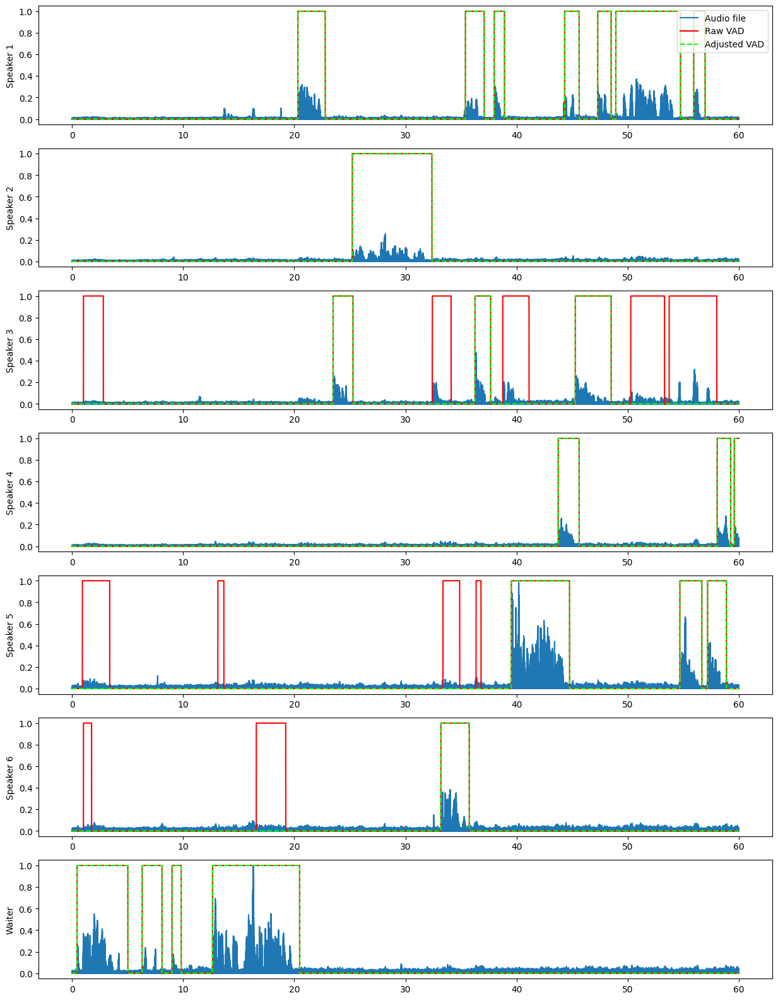

In [46]:
# plot the speech, the original VAD and the adjusted VAD
# for ease of plotting, the absolute magnitude of speech is plotted
figure,axs=plt.subplots(7,1, figsize=(15,20));

wavplot=wav.t().numpy()
normfactor=1/np.max(np.abs(wavplot))

for i in range(len(axs)):
    axs[i].plot(np.linspace(0, 60, SAMPLING_RATE*60), np.abs(wavplot[:,i])*normfactor);
    axs[i].plot(np.linspace(0, 60, SAMPLING_RATE*60), speechmatrix[i], 'red')
    axs[i].plot(np.linspace(0, 60, SAMPLING_RATE*60), adjustedspeechmatrix[i], color='lime', linestyle='dashed')
    if i!=6:
        axs[i].set_ylabel(f'Speaker {i+1}')
    else:
        axs[i].set_ylabel(f'Waiter')    
    plt.sca(axs[i])
    plt.ylim([-0.05,1.05])

axs[0].legend(['Audio file', 'Raw VAD', 'Adjusted VAD'], loc='upper right')

plt.show()

### Listen to the result
Here you can compare the raw audio signal for a given channel to the speech-only segments detected by the VAD routine.

In [47]:
speaker=0
save_audio(f'{room}_{session}_{timing}_speaker_{speaker}.wav',
           wav[speaker,:], sampling_rate=SAMPLING_RATE) 
Audio(f'speaker_{speaker}.wav')

In [48]:
speaker=0
save_audio(f'{room}_{session}_{timing}_only_speaker_{speaker}.wav',
           collect_chunks(adjustedspeechtimestamps[speaker], wav[speaker,:]), sampling_rate=SAMPLING_RATE) 
Audio(f'only_speech_speaker_{speaker}.wav')

## Automatic transcription
Although not directly providied in the GiN database, it may be useful to obtain automatic transcriptions of the scene. An example of this is provided here using Open AI's [Whisper](https://github.com/openai/whisper).

In [49]:
import os
import numpy as np
import glob
import re
import csv
import scipy.io
try:
    import tensorflow  # required in Colab to avoid protobuf compatibility issues
except ImportError:
    pass

import torch
import pandas as pd
import whisper
import torchaudio
import ssl

from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
ssl._create_default_https_context = ssl._create_unverified_context

In [50]:
model = whisper.load_model("medium.en")
print(
    f"Model is {'multilingual' if model.is_multilingual else 'English-only'} "
    f"and has {sum(np.prod(p.shape) for p in model.parameters()):,} parameters."
)
options = whisper.DecodingOptions(language="en", without_timestamps=True)

Model is English-only and has 762,320,896 parameters.


In [51]:
result=model.transcribe(f'{room}_{session}_{timing}_only_speaker_{speaker}.wav')
print(result["text"])

 I've always wanted to go to Mexico. To North you're liking, okay. I like Bolivia, okay, okay. I think it doesn't, no. Okay, how about instead of Bolivia, what does have a coast? No, Chile. Chile works.
